In [2]:
import spikeinterface.full as si
from probeinterface.plotting import plot_probe, plot_probegroup
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import gridspec
from scipy import stats
import os
from Helpers import plot_utility
from P2_PostProcess.VirtualReality.plotting import get_vmin_vmax, min_max_normalize
from P2_PostProcess.VirtualReality.spatial_information import calculate_spatial_information

In [3]:
def calculate_spatial_variance(spike_data):
    if "firing_times_vr" in list(spike_data):
        fr_col = "firing_times_vr"
    else:
        fr_col = "firing_times"
        
    spatial_variances = []
    for cluster_index, cluster_id in enumerate(spike_data.cluster_id):
        firing_times_cluster = spike_data[fr_col].iloc[cluster_index]

        if len(firing_times_cluster)>1:
            cluster_firing_maps = np.array(spike_data['fr_binned_in_space_smoothed'].iloc[cluster_index])
            cluster_firing_maps[np.isnan(cluster_firing_maps)] = 0
            cluster_firing_maps[np.isinf(cluster_firing_maps)] = 0
            variance = np.mean(np.nanstd(cluster_firing_maps,axis=0)) 
            spatial_variances.append(variance)
        else:
            spatial_variances.append(np.nan)
    spike_data["spatial_variance"] = spatial_variances
    return spike_data

In [4]:
def get_data(vr_session_base_names, of_session_base_names):
    project_path = "/mnt/datastore/Harry/Cohort11_april2024/derivatives/"
    
    master_data = pd.DataFrame()
    for vr_name, of_name in zip(vr_session_base_names, of_session_base_names):
        mouse = vr_name.split("_")[0]
        day = vr_name.split("_")[1]
        vr_path = f"{project_path}{mouse}/{day}/vr/{vr_name}/processed/kilosort4/spikes.pkl"
        of_path = f"{project_path}{mouse}/{day}/of/{of_name}/processed/kilosort4/spikes.pkl"
        sorting_analyzer_path = f"{project_path}{mouse}/{day}/ephys/sorting_analyzer"
        spike_data_vr = pd.read_pickle(vr_path); spike_data_vr["firing_times_vr"] = spike_data_vr["firing_times"]
        spike_data_of = pd.read_pickle(of_path); spike_data_of["firing_times_of"] = spike_data_of["firing_times"]
        spike_data = pd.merge(spike_data_vr, spike_data_of, on="cluster_id")

        sorting_analyzer = si.load_sorting_analyzer(sorting_analyzer_path)
        ulc = sorting_analyzer.get_extension("unit_locations")
        unit_locations = ulc.get_data(outputs="by_unit")
        spike_data['unit_location_x'] = (spike_data.index.map(lambda unit: unit_locations[unit][0])*-1)+750+40
        spike_data['unit_location_y'] = spike_data.index.map(lambda unit: unit_locations[unit][1])
        spike_data['unit_location_z'] = spike_data.index.map(lambda unit: unit_locations[unit][2])

        position_path = f"{project_path}{mouse}/{day}/vr/{vr_name}/processed/position_data.csv"
        processed_position_path = f"{project_path}{mouse}/{day}/vr/{vr_name}/processed/processed_position_data.pkl"
        position_data = pd.read_csv(position_path)
        processed_position_data = pd.read_pickle(processed_position_path)
        spike_data = calculate_spatial_information(spike_data, position_data, track_length=200)
        spike_data = calculate_spatial_variance(spike_data)
        spike_data = spike_data.sort_values(by=["spatial_information_score_Isec"], ascending=False)

        spike_data = spike_data[(spike_data["snr_x"] > 1) & 
                                (spike_data["mean_firing_rate_x"] > 0.5) & 
                                (spike_data["rp_contamination_x"] < 0.9)]
        master_data = pd.concat([master_data, spike_data],ignore_index=True)
    return master_data

In [5]:
def plot_rate_maps(spike_data):
    if "firing_times_vr" in list(spike_data):
        fr_col = "firing_times_vr"
    else:
        fr_col = "firing_times"
        
    rate_maps = []
    for cluster_index, cluster_id in enumerate(spike_data.cluster_id):
        firing_times_cluster = spike_data[fr_col].iloc[cluster_index]

        if len(firing_times_cluster)>1:
            cluster_firing_maps = np.array(spike_data['fr_binned_in_space_smoothed'].iloc[cluster_index])
            cluster_firing_maps[np.isnan(cluster_firing_maps)] = 0
            cluster_firing_maps[np.isinf(cluster_firing_maps)] = 0
            percentile_99th_display = np.nanpercentile(cluster_firing_maps, 95);
            cluster_firing_maps = min_max_normalize(cluster_firing_maps)
            percentile_99th = np.nanpercentile(cluster_firing_maps, 95); 
            cluster_firing_maps = np.clip(cluster_firing_maps, a_min=0, a_max=percentile_99th)
            vmin, vmax = get_vmin_vmax(cluster_firing_maps)
            rate_maps.append(cluster_firing_maps)

    cmap = plt.cm.get_cmap("viridis")
    nrows = int(np.ceil(np.sqrt(len(spike_data))))
    ncols = nrows; i=0; j=0;
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 20), squeeze=False)
    for m, rate_map in enumerate(rate_maps):
        vmin, vmax = get_vmin_vmax(rate_map)
        locations = np.arange(0, len(rate_map[0]))
        ordered = np.arange(0, len(rate_map), 1)
        X, Y = np.meshgrid(locations, ordered)
        ax[j, i].pcolormesh(X, Y, rate_map, cmap=cmap, shading="auto", vmin=vmin, vmax=vmax)
        #ax[j, i].text(0,0, spike_data["cluster_id"].iloc[m],color="white", fontsize=15)
        i+=1
        if i==ncols:
            i=0; j+=1
    for j in range(nrows):
        for i in range(ncols):
            ax[j, i].spines['top'].set_visible(False)
            ax[j, i].spines['right'].set_visible(False)
            ax[j, i].spines['bottom'].set_visible(False)
            ax[j, i].spines['left'].set_visible(False)
            ax[j, i].set_xticks([])
            ax[j, i].set_yticks([])
            ax[j, i].xaxis.set_tick_params(labelbottom=False)
            ax[j, i].yaxis.set_tick_params(labelleft=False)
    plt.subplots_adjust(hspace=.1, wspace=.1, bottom=None, left=None, right=None, top=None)
    plt.show()

def plot_average_rate_maps(spike_data):
    if "firing_times_vr" in list(spike_data):
        fr_col = "firing_times_vr"
    else:
        fr_col = "firing_times"
        
    rate_maps = []
    for cluster_index, cluster_id in enumerate(spike_data.cluster_id):
        firing_times_cluster = spike_data[fr_col].iloc[cluster_index]

        if len(firing_times_cluster)>1:
            cluster_firing_maps = np.array(spike_data['fr_binned_in_space_smoothed'].iloc[cluster_index])
            cluster_firing_maps[np.isnan(cluster_firing_maps)] = 0
            cluster_firing_maps[np.isinf(cluster_firing_maps)] = 0
            percentile_99th_display = np.nanpercentile(cluster_firing_maps, 95);
            cluster_firing_maps = min_max_normalize(cluster_firing_maps)
            percentile_99th = np.nanpercentile(cluster_firing_maps, 95); 
            cluster_firing_maps = np.clip(cluster_firing_maps, a_min=0, a_max=percentile_99th)
            vmin, vmax = get_vmin_vmax(cluster_firing_maps)
            rate_maps.append(cluster_firing_maps)

    nrows = int(np.ceil(np.sqrt(len(spike_data))))
    ncols = nrows; i=0; j=0;
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 20), squeeze=False)
    for m, rate_map in enumerate(rate_maps):
        locations = np.arange(0, len(rate_map[0]))
        ax[j, i].fill_between(locations, np.nanmean(rate_map, axis=0) - stats.sem(rate_map, axis=0,nan_policy="omit"),
                                    np.nanmean(rate_map, axis=0) + stats.sem(rate_map, axis=0,nan_policy="omit"), color="black", alpha=0.2)
        ax[j, i].plot(locations, np.nanmean(rate_map, axis=0), color="black", linewidth=1)
        ax[j, i].set_xlim([0, len(rate_map[0])])
        max_fr = max(np.nanmean(rate_map, axis=0)+stats.sem(rate_map, axis=0))
        max_fr = max_fr+(0.1*(max_fr))
        ax[j, i].set_ylim([0, max_fr])
        ax[j, i].set_yticks([0, np.round(ax[j, i].get_ylim()[1], 1)])
        ax[j, i].set_ylim(bottom=0)
        plot_utility.style_track_plot(ax[j, i], len(rate_map[0]), alpha=0.15)
        i+=1
        if i==ncols:
            i=0; j+=1
    for j in range(nrows):
        for i in range(ncols):
            ax[j, i].spines['top'].set_visible(False)
            ax[j, i].spines['right'].set_visible(False)
            ax[j, i].spines['bottom'].set_visible(False)
            ax[j, i].spines['left'].set_visible(False)
            ax[j, i].set_xticks([])
            ax[j, i].set_yticks([])
            ax[j, i].xaxis.set_tick_params(labelbottom=False)
            ax[j, i].yaxis.set_tick_params(labelleft=False)
    plt.subplots_adjust(hspace=.1, wspace=.1, bottom=None, left=None, right=None, top=None)
    plt.show()

In [6]:
def plot_of_rate_maps(spike_data):

    rate_maps = []
    for cluster_index, cluster_id in enumerate(spike_data.cluster_id):
        cluster_df = spike_data[(spike_data.cluster_id == cluster_id)] # dataframe for that cluster
        firing_rate_map_original = cluster_df['firing_maps'].iloc[0]
        occupancy_map = cluster_df['occupancy_maps'].iloc[0]
        firing_rate_map_original[occupancy_map==0] = np.nan
        firing_rate_map = np.rot90(firing_rate_map_original)
        rate_maps.append(firing_rate_map)
 
    nrows = int(np.ceil(np.sqrt(len(spike_data))))
    ncols = nrows; i=0; j=0; 
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 20), squeeze=False)
    cmap = plt.cm.get_cmap("jet")
    cmap.set_bad("white")
    for rate_map in rate_maps:
        ax[j, i].imshow(rate_map, cmap=cmap, interpolation='nearest')
        i+=1
        if i==ncols:
            i=0; j+=1
    for j in range(nrows):
        for i in range(ncols):
            ax[j, i].spines['top'].set_visible(False)
            ax[j, i].spines['right'].set_visible(False)
            ax[j, i].spines['bottom'].set_visible(False)
            ax[j, i].spines['left'].set_visible(False)
            ax[j, i].set_xticks([])
            ax[j, i].set_yticks([])
            ax[j, i].xaxis.set_tick_params(labelbottom=False)
            ax[j, i].yaxis.set_tick_params(labelleft=False)
    plt.show()


In [7]:
spike_data = get_data(vr_session_base_names =["M21_D26_2024-05-28_17-04-41_VR1"],
                      of_session_base_names = ["M21_D26_2024-05-28_16-35-31_OF1"])
spike_data = spike_data[spike_data["unit_location_y"] < 2200]
spike_data = spike_data.sort_values(by=["grid_score"], ascending=False)
plot_rate_maps(spike_data)
plot_of_rate_maps(spike_data)

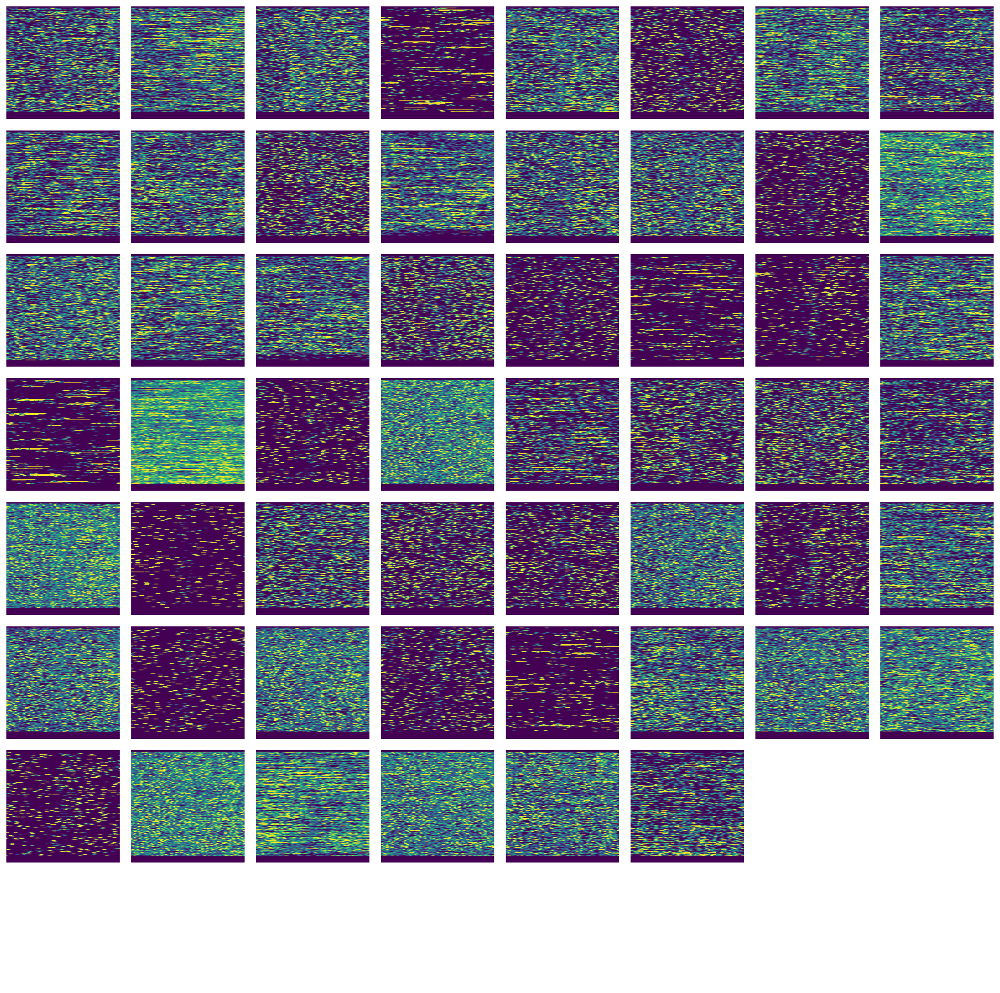

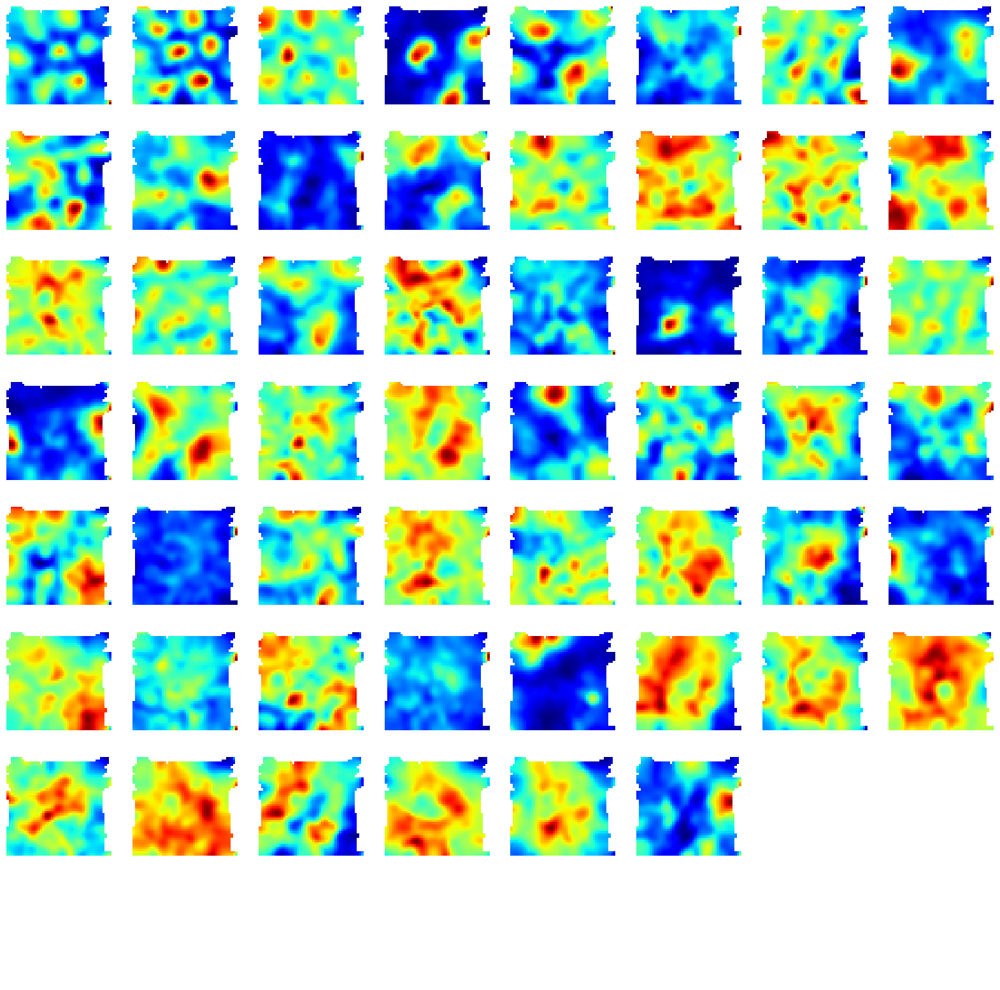

In [8]:
spike_data = get_data(vr_session_base_names =["M20_D25_2024-05-27_14-24-21_VR1"],
                      of_session_base_names = ["M20_D25_2024-05-27_13-57-19_OF1"])
spike_data = spike_data[spike_data["unit_location_y"] < 2200]
spike_data = spike_data.sort_values(by=["grid_score"], ascending=False)
plot_rate_maps(spike_data)
plot_of_rate_maps(spike_data)


##### plot rate maps according to region, I've decided anything above y_pos = 2200 was reasonable

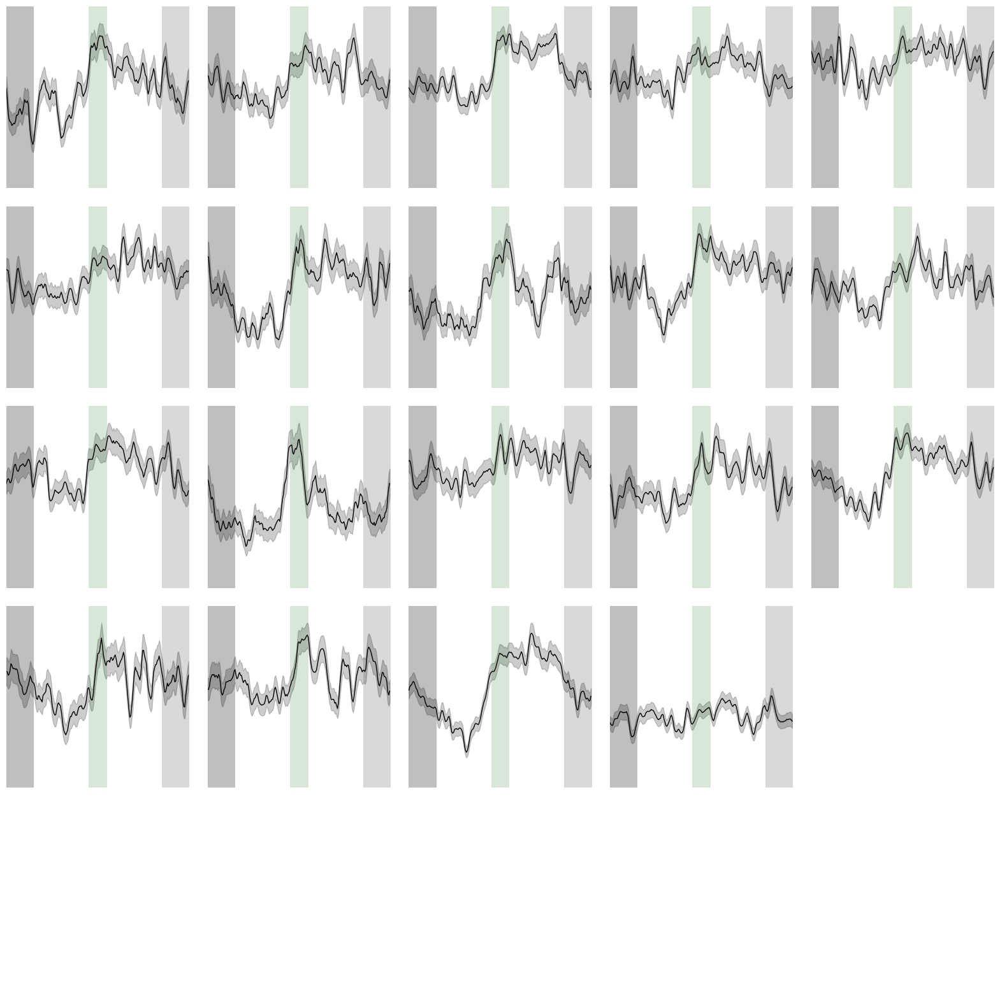

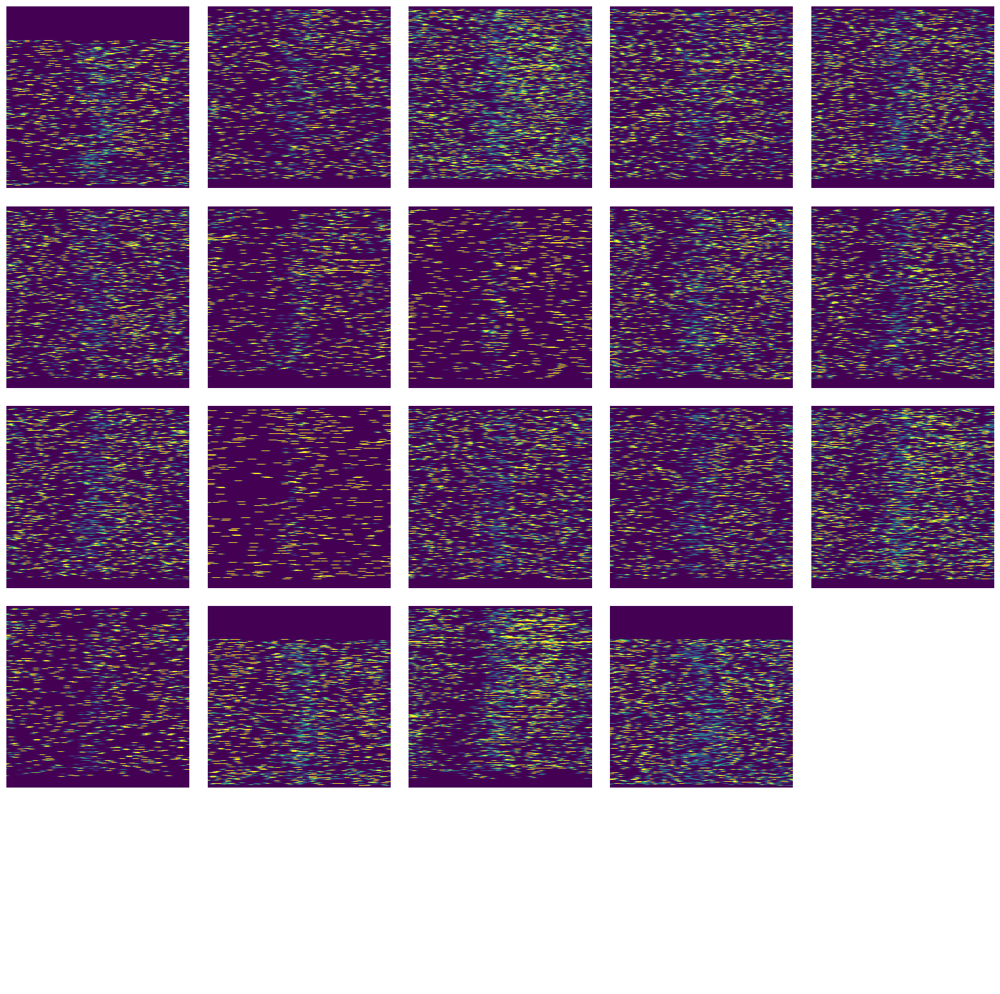

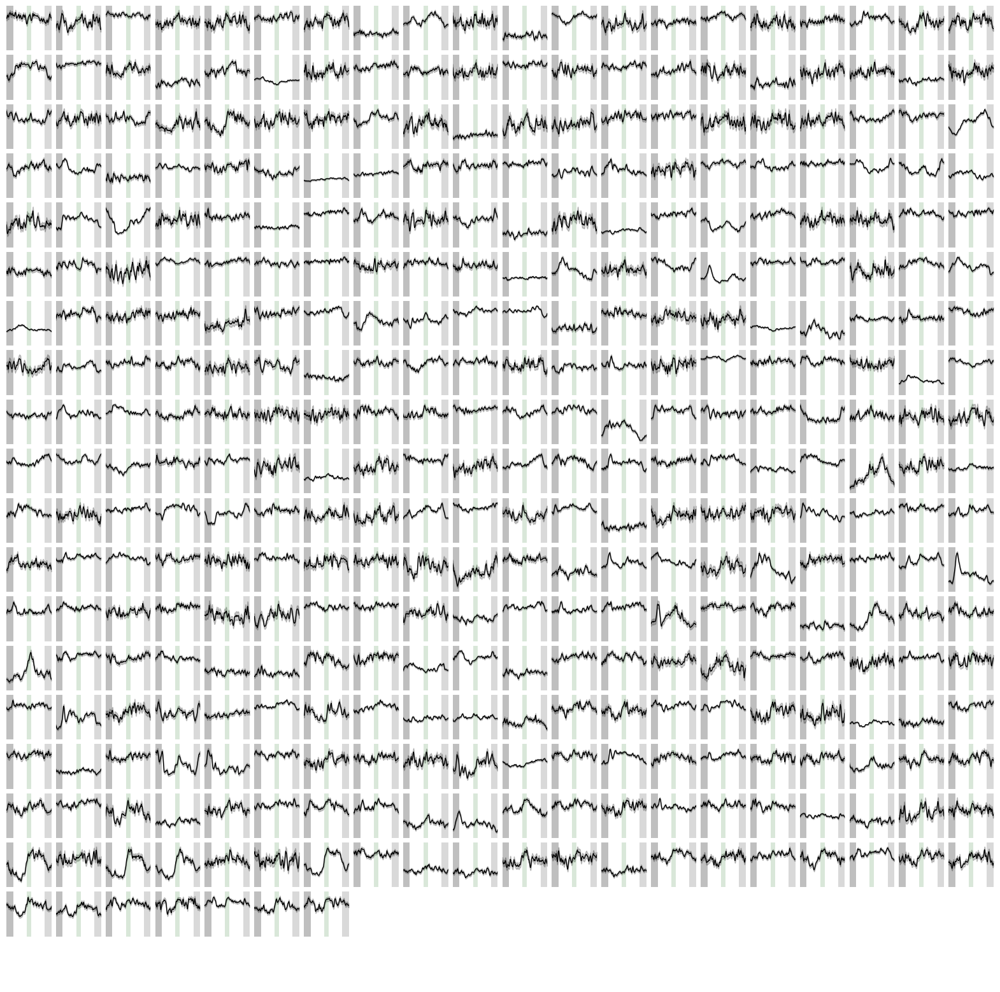

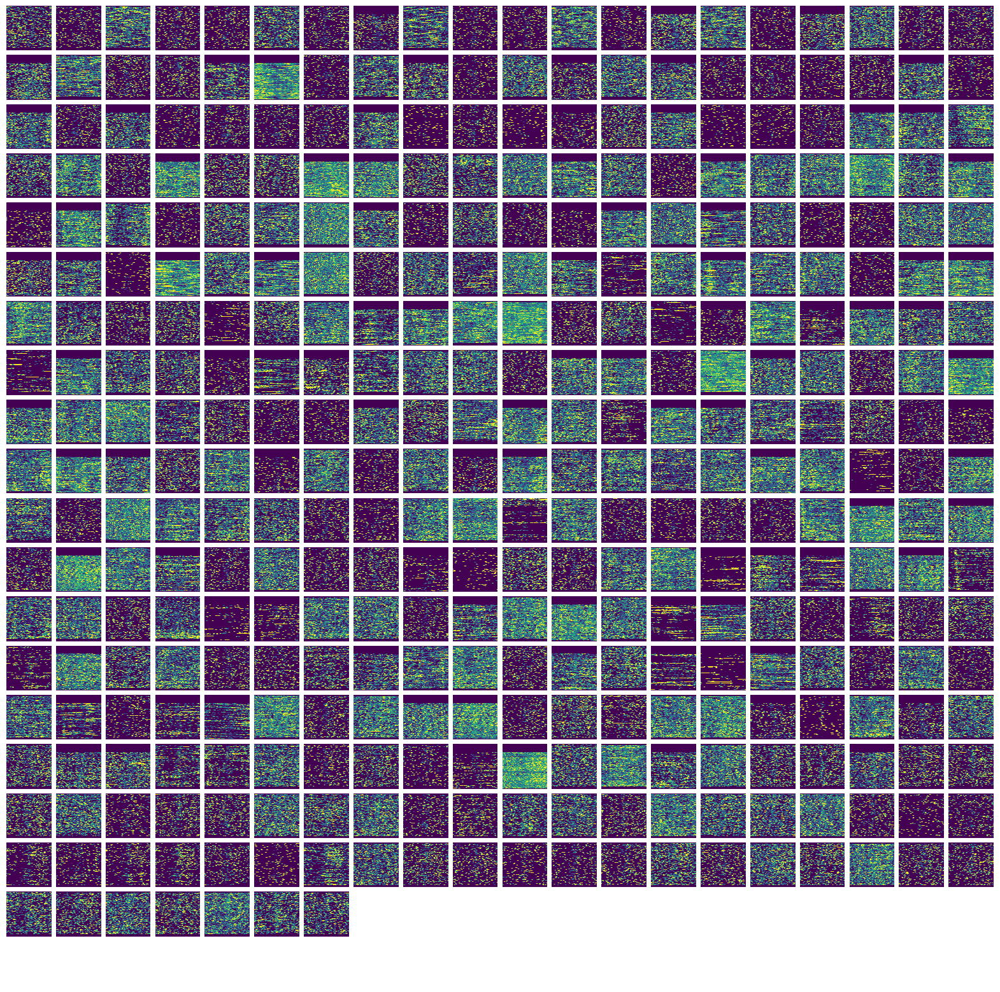

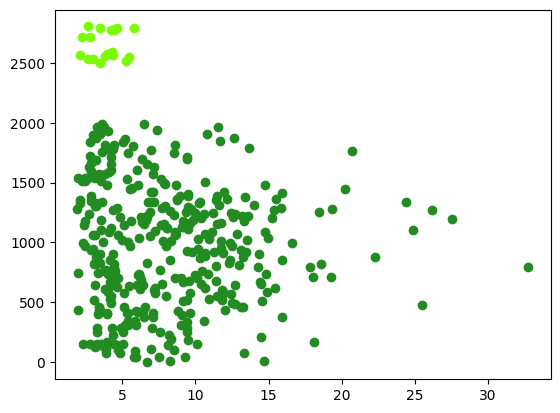

In [5]:
spike_data = get_data(vr_session_base_names = ["M20_D23_2024-05-25_14-54-34_VR1",
                      "M20_D24_2024-05-26_14-49-32_VR1", 
                      "M20_D25_2024-05-27_14-24-21_VR1",
                      "M20_D26_2024-05-28_15-18-55_VR1"],
                      of_session_base_names = ["M20_D23_2024-05-25_14-10-43_OF1",
                      "M20_D24_2024-05-26_14-17-55_OF1", 
                      "M20_D25_2024-05-27_13-57-19_OF1",
                      "M20_D26_2024-05-28_14-31-11_OF1"])

visual_cortex_data = spike_data[spike_data["unit_location_y"] > 2500]
visual_cortex_data = visual_cortex_data.sort_values(by=["unit_location_y"], ascending=False)
plot_average_rate_maps(visual_cortex_data)
plot_rate_maps(visual_cortex_data)

entorhinal_cortex_data = spike_data[spike_data["unit_location_y"] < 2000]
entorhinal_cortex_data = entorhinal_cortex_data.sort_values(by=["unit_location_y"], ascending=False)
plot_average_rate_maps(entorhinal_cortex_data)
plot_rate_maps(entorhinal_cortex_data) 

plt.scatter(visual_cortex_data["spatial_variance"], visual_cortex_data["unit_location_y"], color="lawngreen")
plt.scatter(entorhinal_cortex_data["spatial_variance"], entorhinal_cortex_data["unit_location_y"], color="forestgreen")
plt.show()

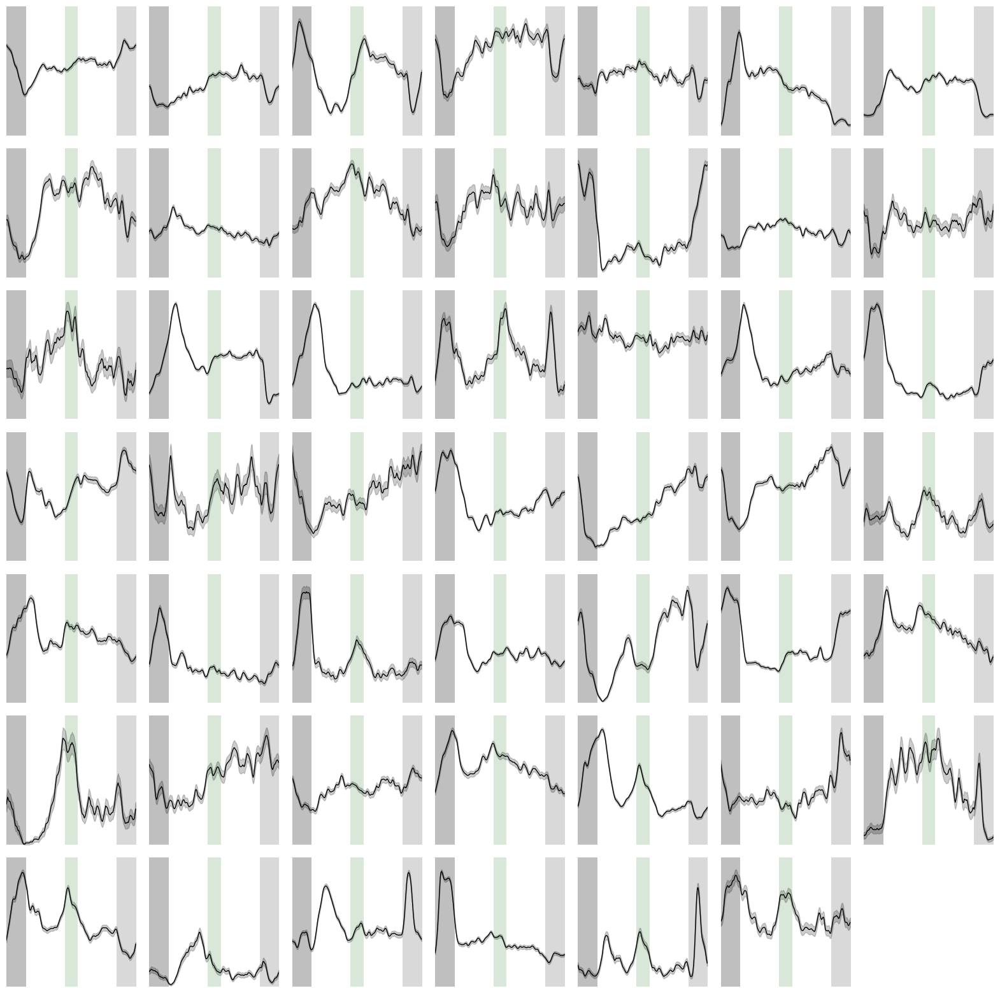

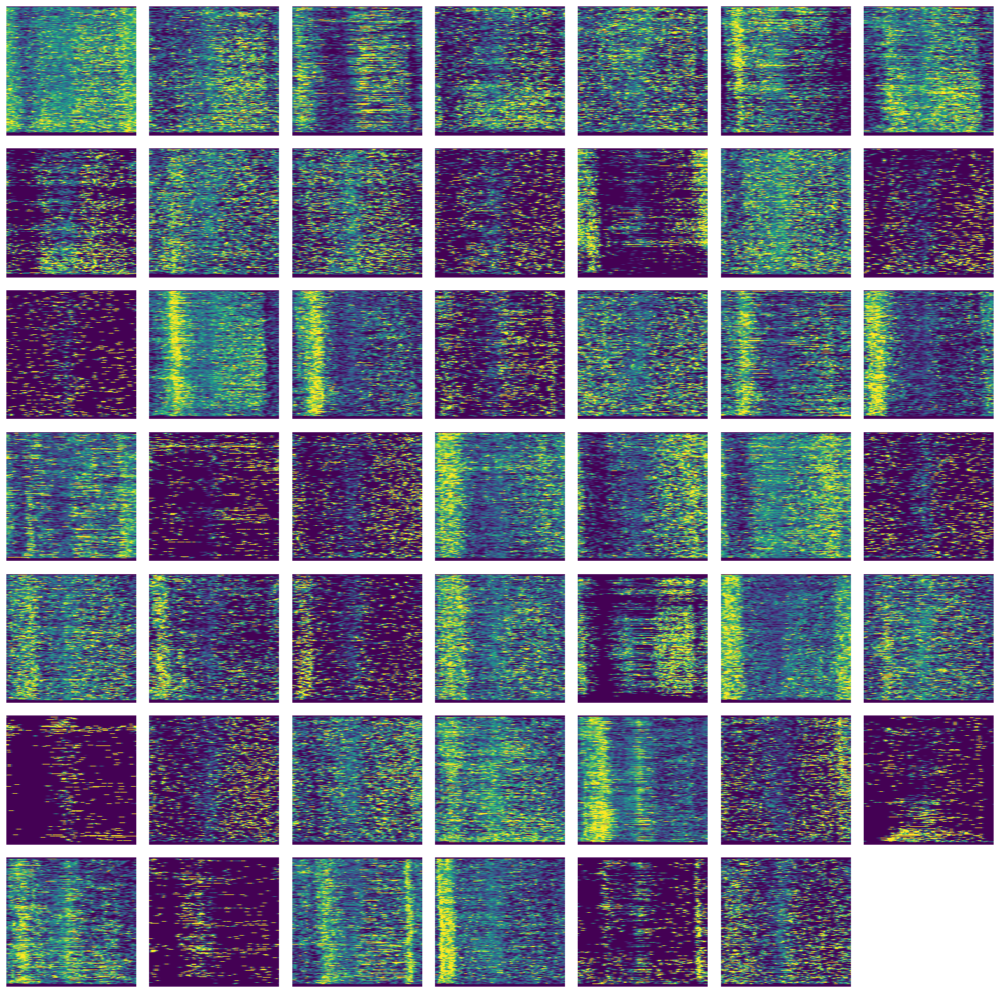

In [5]:
spike_data = get_data(vr_session_base_names = ["M21_D26_2024-05-28_17-04-41_VR1", 
                                               "M21_D23_2024-05-25_16-54-12_VR1", 
                                               "M21_D25_2024-05-27_16-00-30_VR1", 
                                               "M21_D24_2024-05-26_16-35-19_VR1"],
                      of_session_base_names = ["M21_D26_2024-05-28_16-35-31_OF1", 
                                               "M21_D23_2024-05-25_16-07-17_OF1", 
                                               "M21_D25_2024-05-27_15-35-57_OF1", 
                                               "M21_D24_2024-05-26_15-58-23_OF1"])
spike_data = get_data(vr_session_base_names = ["M21_D23_2024-05-25_16-54-12_VR1"],
                      of_session_base_names = ["M21_D23_2024-05-25_16-07-17_OF1"])
visual_cortex_data = spike_data[spike_data["unit_location_y"] > 2500]
visual_cortex_data = visual_cortex_data.sort_values(by=["unit_location_y"], ascending=False)
plot_average_rate_maps(visual_cortex_data)
plot_rate_maps(visual_cortex_data)

entorhinal_cortex_data = spike_data[spike_data["unit_location_y"] < 2000]
entorhinal_cortex_data = entorhinal_cortex_data.sort_values(by=["unit_location_y"], ascending=False)
plot_average_rate_maps(entorhinal_cortex_data)
plot_rate_maps(entorhinal_cortex_data) 


plt.scatter(visual_cortex_data["spatial_variance"], visual_cortex_data["unit_location_y"], color="lawngreen")
plt.scatter(entorhinal_cortex_data["spatial_variance"], entorhinal_cortex_data["unit_location_y"], color="forestgreen")
plt.show()